<a href="https://www.kaggle.com/code/rubanzasilva/xgb-lgb-cat-neural-nets-with-fast-ai?scriptVersionId=201652533" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Loan Approval Prediction

The goal for this competition is to predict whether an applicant is approved for a loan.

# Library and Data import

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/s04e10-autogluon-model/submission.csv
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248SummaryOfModels.html
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248/version.txt
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248/metadata.json
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248/learner.pkl
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248/predictor.pkl
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248/utils/data/X.pkl
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248/utils/data/y.pkl
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248/models/trainer.pkl
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248/models/RandomForestEntr_BAG_L2/model.pkl
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248/models/RandomForestEntr_BAG_L2/utils/model_template.pkl
/kaggl

In [2]:
%%time
%pip install catboost
%pip install optuna
#%pip install optuna_distributed
#%pip install openfe
%pip install seaborn
%pip install xgboost
%pip install lightgbm
%pip install fastkaggle
#%pip install h2o
%pip install -Uqq fastbook
#%pip install polars
%pip install -q -U autogluon.tabular
%pip install autogluon
#%pip install --upgrade pip
%pip install tqdm
#%pip install wandb
#%pip install sweetviz

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
aiobotocore 2.15.0 requires botocore<1.35.17,>=1.35.16, but you have botocore 1.29.165 which is incompatible.
bigframes 0.22.0 requires google-cloud-bigquery[bqstorage,pandas]>=3.10.0, but you have google-cloud-bigquery 2.34.4 which is incompatible.
bigframes 0.22.0 requires google-cloud-storage>=2.0.0, but you have google-cloud-storage 1.44.0 which is incompat

In [3]:
!pip install h2o
!pip install requests
!pip install tabulate
!pip install future

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from numpy import random
from tqdm import tqdm

import fastbook
fastbook.setup_book()
from fastbook import *
from fastai.tabular.all import *
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from numpy import random
from tqdm import tqdm
from ipywidgets import interact

from fastai.imports import *
np.set_printoptions(linewidth=130)


from sklearn.ensemble import RandomForestClassifier
#from sklearn.metrics import root_mean_squared_error
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import VotingClassifier,StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold,StratifiedKFold, cross_val_score,train_test_split


from pathlib import Path
import os

import xgboost as xgb
from xgboost import plot_importance
from xgboost import XGBClassifier

import lightgbm as lgb
from lightgbm import LGBMClassifier

from catboost import CatBoostClassifier,CatBoostRegressor,Pool, metrics, cv


import warnings


#from openfe import OpenFE, transform
from autogluon.tabular import TabularDataset, TabularPredictor

#import h2o
#from h2o.automl import H2OAutoML

import gc

import optuna
from optuna.samplers import TPESampler

import pickle
from joblib import dump, load
#import sweetviz as sv
#from IPython.display import FileLink

import h2o
from h2o.automl import H2OAutoML

In [5]:
!ls /kaggle/input/playground-series-s4e10

sample_submission.csv  test.csv  train.csv


In [6]:
path = Path('/kaggle/input/playground-series-s4e10/')
path

Path('/kaggle/input/playground-series-s4e10')

In [7]:
!ls 

__notebook__.ipynb


In [8]:
train_df = pd.read_csv(path/'train.csv',index_col='id')
test_df = pd.read_csv(path/'test.csv',index_col='id')
sub_df = pd.read_csv(path/'sample_submission.csv')
original = pd.read_csv('/kaggle/input/loan-approval-prediction/credit_risk_dataset.csv')

In [9]:
train_df.shape,original.shape

((58645, 12), (32581, 12))

In [10]:
train_df = pd.concat([train_df, original], ignore_index=True)

In [11]:
train_df.shape

(91226, 12)

In [12]:
#comp = 'playground-series-s4e10'

#path = setup_comp(comp, install='fastai "timm>=0.6.2.dev0"')

In [13]:
#iskaggle = os.environ.get('KAGGLE_KERNEL_RUN_TYPE', '')

#if iskaggle: path = Path('playground-series-s4e10/')
#else:
    #import zipfile,kaggle
    #path = Path('playground-series-s4e10')
    #kaggle.api.competition_download_cli(str(path))
    #zipfile.ZipFile(f'{path}.zip').extractall(pat

# Exploratory Data Analysis

In [14]:
train_df.shape

(91226, 12)

In [15]:
train_df.columns

Index(['person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length', 'loan_status'],
      dtype='object')

In [16]:
train_df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
0,37,35000,RENT,0.0,EDUCATION,B,6000,11.49,0.17,N,14,0
1,22,56000,OWN,6.0,MEDICAL,C,4000,13.35,0.07,N,2,0
2,29,28800,OWN,8.0,PERSONAL,A,6000,8.90,0.21,N,10,0
3,30,70000,RENT,14.0,VENTURE,B,12000,11.11,0.17,N,5,0
4,22,60000,RENT,2.0,MEDICAL,A,6000,6.92,0.10,N,3,0


Missing value check

In [17]:
missing_values_count = train_df.isnull().sum()
sorted_missing_values = missing_values_count.sort_values(ascending=False)
print(sorted_missing_values)

loan_int_rate                 3116
person_emp_length              895
person_age                       0
person_income                    0
person_home_ownership            0
loan_intent                      0
loan_grade                       0
loan_amnt                        0
loan_percent_income              0
cb_person_default_on_file        0
cb_person_cred_hist_length       0
loan_status                      0
dtype: int64


In [18]:
#Missing values returned as percentages.
missing_percentages = train_df.isnull().mean() * 100
sorted_missing_percentages = missing_percentages.sort_values(ascending=False)
print(sorted_missing_percentages)

loan_int_rate                 3.415693
person_emp_length             0.981080
person_age                    0.000000
person_income                 0.000000
person_home_ownership         0.000000
loan_intent                   0.000000
loan_grade                    0.000000
loan_amnt                     0.000000
loan_percent_income           0.000000
cb_person_default_on_file     0.000000
cb_person_cred_hist_length    0.000000
loan_status                   0.000000
dtype: float64


# fast.ai preprocessing

In [19]:
cont_names,cat_names = cont_cat_split(train_df, dep_var='loan_status')
splits = RandomSplitter(valid_pct=0.2)(range_of(train_df))
to = TabularPandas(train_df, procs=[Categorify, FillMissing,Normalize],
#to = TabularPandas(train_df, procs=[Categorify,Normalize],
                   cat_names = cat_names,
                   cont_names = cont_names,
                   y_names='loan_status',
                   y_block=CategoryBlock(),
                   splits=splits)
dls = to.dataloaders(bs=64)
#dls = to.dataloaders(bs=1024)
test_dl = dls.test_dl(test_df)
X_train, y_train = to.train.xs, to.train.ys.values.ravel()
X_test, y_test = to.valid.xs, to.valid.ys.values.ravel()

/opt/conda/lib/python3.10/site-packages/fastai/tabular/core.py:314: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  to[n].fillna(self.na_dict[n], inplace=True)
/opt/conda/lib/python3.10/site-packages/fastai/tabular/core.py:314: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For exampl

# Modelling

## Neural Network

In [20]:
learn = tabular_learner(dls, metrics=RocAucBinary())

SuggestedLRs(valley=0.0030199517495930195)

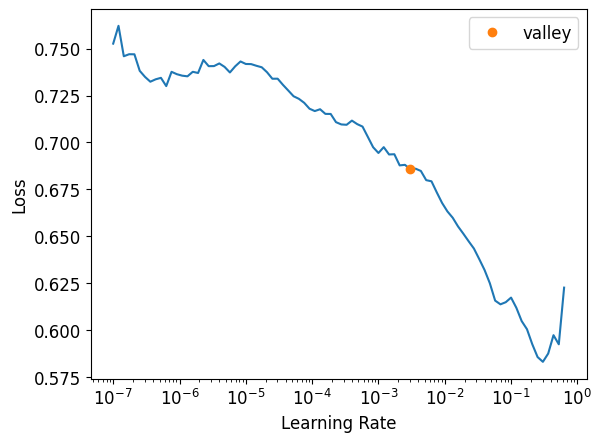

In [21]:
learn.lr_find()

In [22]:
learn.fit_one_cycle(30,1e-6)

epoch,train_loss,valid_loss,roc_auc_score,time
0,0.739897,0.726938,0.625291,00:13
1,0.722690,0.717139,0.649856,00:13
2,0.712935,0.680854,0.653539,00:13
3,0.677493,0.676122,0.793572,00:13
4,0.658794,0.654202,0.829866,00:13
5,0.641448,0.628949,0.844014,00:13
6,0.628749,0.598073,0.840571,00:13
7,0.613246,0.605215,0.853744,00:13
8,0.609786,0.592077,0.859211,00:13
9,0.605375,0.602589,0.860112,00:13


In [23]:
dl = test_dl

In [24]:
learn.save('nn_model_loan_approval_v1')

Path('models/nn_model_loan_approval_v1.pth')

In [25]:
#learn.load('nn_model_loan_approval_v1')  

In [26]:
#test_df.shape

In [27]:
nn_preds_x1 = learn.get_preds(dl=dl)[0]

In [28]:
nn_preds_x1

tensor([[0.0269, 0.9731],
        [0.6760, 0.3240],
        [0.1603, 0.8397],
        ...,
        [0.4735, 0.5265],
        [0.0231, 0.9769],
        [0.0542, 0.9458]])

In [29]:
#i select the 2nd column of the nn_preds
final_preds = nn_preds_x1[:, 1]
final_preds

tensor([0.9731, 0.3240, 0.8397,  ..., 0.5265, 0.9769, 0.9458])

In [30]:
final_preds.shape

torch.Size([39098])

In [31]:
#sub_df['loan_status'] = final_preds
#sub_df.to_csv('submission.csv', index=False)
#sub = pd.read_csv('submission.csv')
#sub

In [32]:
#dl = test_dl
#nn_preds = learn.get_preds(dl=dl)
#nn_preds_x = learn.get_preds()[0]
#a_preds, _ = learn.get_preds(dl=dl)
#nn_preds_y = a_preds.squeeze(1)
#nn_preds_proba = (a_preds[:, 1])

## XGBoost

In [33]:
xgb_params = {
    'eta': 0.044303752452182654,
    'n_estimators': 7238,
    'colsample_bytree': 0.7616580256429863,
    'subsample': 0.6586623872476727,
    'max_depth': 7,
    'min_child_weight': 17, 
    'booster': 'gbtree',
    'tree_method':'hist',
    'objective': 'binary:logistic',
    'eval_metric': 'auc',
    'device':'cuda',
}


lgbm_params = {
    'objective': 'binary',
    'boosting_type': 'gbdt',
    'num_leaves': 239,
    'learning_rate': 0.0030069363268241766,
    'n_estimators': 7689,
    'subsample_for_bin': 279725,
    'min_child_samples': 144, 
    'reg_alpha': 1.9893991901582224e-09,
    'reg_lambda': 0.18713346824755625, 
    'colsample_bytree': 0.5892053831677966,
    'subsample': 0.3744929266207266,
    'max_depth': 9
}

cat_optuna_params = {
    'loss_function': 'Logloss',
    'eval_metric': 'AUC',
    #'class_names': [0, 1],
    'learning_rate': 0.05,
    'iterations': 5000,
    'depth': 12,
    'random_strength': 0,
    'l2_leaf_reg': 0.5,
    #'max_leaves': 512,
    'fold_permutation_block': 64,
    #'task_type': 'GPU',
    #'devices': '0:1',
    'random_seed': 42,
    'verbose': False,
    'allow_writing_files': False
}

cat_params = {
    'depth': 8,
    'learning_rate': 0.19793301995319765,
    'bagging_temperature': 0.7779373495258176,
    'l2_leaf_reg': 5,
    'loss_function': 'Logloss',
    'iterations': 300,
    'grow_policy': 'Lossguide',
    'eval_metric': 'AUC',
}

#xgb params from https://www.kaggle.com/code/adyiemaz/xgb-loan-approval-prediction
xgb_params_adyiemaz = {
    'colsample_bytree': 0.5,
    'learning_rate' :0.05,
    'max_depth':5,
    'n_estimators':800,
    'reg_alpha': 1,
    'reg_lambda':0.5,
    'subsample':1,
    'eval_metric':'auc',
    'gamma':0,
    'random_state':42,
    #'early_stopping_rounds':50
}

### Optuna optimization

In [34]:
#def objective(trial):
    #params = {
        #'num_leaves': trial.suggest_int('num_leaves', 100, 500),
        #'eta': trial.suggest_float('eta', 0.001, 1.0, log=True),
        #'n_estimators': trial.suggest_int('n_estimators', 300, 10000),
        #'colsample_bytree': trial.suggest_float('colsample_bytree', 0.4, 1.0),
        #'subsample': trial.suggest_float('subsample', 0.25, 1.0),
        #'max_depth': trial.suggest_int('max_depth', 1, 15),
        #'objective': 'binary:logistic',
        #'eval_metric': 'auc',
        #'device':'cuda',

    #}
    
    #K_FOLDS = 10  # Number of folds for cross-validation
    #kfold = KFold(n_splits=K_FOLDS, shuffle=True, random_state=42)

    #xgb_fold_scores = []
    
    #for train_index, test_index in kfold.split(train_df):
    #print(f'train: {len(train_index)} samples, test: {len(test_index)} samples')

    #for train_index, val_index in kfold.split(X_train):
        #X_fold_train, X_fold_val = X_train.iloc[train_index], X_train.iloc[val_index]
        #y_fold_train, y_fold_val = y_train[train_index], y_train[val_index]
        
        # Train the model on the current fold
        
        #xgb_model_fold = xgb.XGBClassifier(**xgb_optuna_params)
        #xgb_model_fold.fit(X_fold_train, y_fold_train)
        
        # Predict probabilities on the validation set for the current fold
        #y_pred_fold = xgb_model_fold.predict_proba(X_fold_val)[:, 1]
        #y_pred_fold_tt = xgb_model_fold.predict(test_dl.xs)
        
        # Calculate and store the AUC-ROC score for the current fold
        #xgb_cv_score = roc_auc_score(y_fold_val, y_pred_fold)
        #xgb_fold_scores.append(xgb_cv_score)
        
        # Calculate the average score across all folds
        #return np.mean(xgb_fold_scores)

# Create and run the study
#study = optuna.create_study(sampler=TPESampler(n_startup_trials=30, multivariate=True, seed=0), direction="maximize")
#study.optimize(objective, n_trials=100)

#print('Best value:', study.best_value)
#print('Best trial:', study.best_trial.params)

### XGB model cross validation

In [35]:
%%time
K_FOLDS = 10  # Number of folds for cross-validation
skf = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=42)
xgb_fold_scores = []

# Array to store out-of-fold predictions
#oof_predictions = np.zeros(len(X_train))

for fold, (train_index, val_index) in enumerate(skf.split(X_train, y_train), 1):
    X_fold_train, X_fold_val = X_train.iloc[train_index], X_train.iloc[val_index]
    y_fold_train, y_fold_val = y_train[train_index], y_train[val_index]
    
    # Train the model on the current fold
    xgb_model_fold = xgb.XGBClassifier(**xgb_params_adyiemaz)
    xgb_model_fold.fit(X_fold_train, y_fold_train)
    
    # Predict on the validation set for the current fold
    y_pred_fold = xgb_model_fold.predict_proba(X_fold_val)[:, 1]
    #y_pred_fold_tt = xgb_model_fold.predict(test_dl.xs)
    
    # Calculate and store the Matthews Correlation Coefficient for the current fold
    xgb_cv_score = roc_auc_score(y_fold_val, y_pred_fold)
    xgb_fold_scores.append(xgb_cv_score)
    
    print(f"Fold {fold} AUC: {xgb_cv_score}")

# Calculate and print the mean score across all folds
xgb_mean_score = np.mean(xgb_fold_scores)
print(f"Mean AUC: {xgb_mean_score}")

Fold 1 AUC: 0.956591521150805
Fold 2 AUC: 0.9561724433274508
Fold 3 AUC: 0.9600551990608854
Fold 4 AUC: 0.9554138853570672
Fold 5 AUC: 0.9569806897647808
Fold 6 AUC: 0.9593295719432083
Fold 7 AUC: 0.957020820089002
Fold 8 AUC: 0.9529691142191142
Fold 9 AUC: 0.9528779932189023
Fold 10 AUC: 0.955322631913541
Mean AUC: 0.9562733870044756
CPU times: user 1min 38s, sys: 519 ms, total: 1min 38s
Wall time: 49.5 s


### On full dataset

In [36]:
%%time
xgb_model = xgb.XGBClassifier(**xgb_params_adyiemaz)
xgb_model = xgb_model.fit(X_train, y_train)

#xgb_preds = tensor(xgb_model.predict(test_dl.xs))
xgb_preds_proba = tensor(xgb_model.predict_proba(test_dl.xs))[:, 1]

xgb_preds_x = tensor(xgb_model.predict(X_test))
xgb_preds_x_proba = tensor(xgb_model.predict_proba(X_test))[:, 1]

xgb_score = roc_auc_score(y_test,xgb_preds_x_proba)
xgb_score

CPU times: user 12 s, sys: 55.7 ms, total: 12 s
Wall time: 6.03 s


0.9591044339150199

In [37]:
#submission
!rm submission.csv
#sub_df['loan_status'] = xgb_preds_proba
#sub_df.to_csv('submission.csv', index=False)
#sub = pd.read_csv('submission.csv')
#sub

rm: cannot remove 'submission.csv': No such file or directory


## LGBM

In [38]:
%%time
K_FOLDS = 10  # Number of folds for cross-validation
skf = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=42)
lgbm_fold_scores = []

for fold, (train_index, val_index) in enumerate(skf.split(X_train, y_train), 1):
    X_fold_train, X_fold_val = X_train.iloc[train_index], X_train.iloc[val_index]
    y_fold_train, y_fold_val = y_train[train_index], y_train[val_index]
    
    # Train the model on the current fold
    lgbm_model_fold = lgb.LGBMClassifier(**lgbm_params)
    lgbm_model_fold.fit(X_fold_train, y_fold_train)
    
    # Predict on the validation set for the current fold
    y_pred_fold = lgbm_model_fold.predict_proba(X_fold_val)[:, 1]
    y_pred_fold_tt = lgbm_model_fold.predict(test_dl.xs)
    
    # Calculate and store the Root Mean Squared Error for the current fold
    lgbm_cv_score = roc_auc_score(y_fold_val, y_pred_fold)
    lgbm_fold_scores.append(lgbm_cv_score)
    
    print(f"Fold {fold} AUC: {lgbm_cv_score}")

# Calculate and print the mean score across all folds
lgbm_mean_score = np.mean(lgbm_fold_scores)
print(f"Mean RMSE: {lgbm_mean_score}")

[LightGBM] [Info] Number of positive: 11234, number of negative: 54448
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 65682, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.171036 -> initscore=-1.578301
[LightGBM] [Info] Start training from score -1.578301
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

In [39]:
print(f"Mean RMSE: {lgbm_mean_score}")

Mean RMSE: 0.9586461519401721


In [40]:
%%time
#ds subset
lgbm_model = lgb.LGBMClassifier(**lgbm_params)
lgbm_model = lgbm_model.fit(X_train, y_train)

#test set preds
#lgbm_preds = tensor(lgbm_model.predict(test_dl.xs))
lgbm_preds_proba = tensor(lgbm_model.predict_proba(test_dl.xs))[:, 1]

lgbm_preds_x_prob = tensor(lgbm_model.predict_proba(X_test))[:, 1]

lgbm_score = roc_auc_score(y_test,lgbm_preds_x_prob)
lgbm_score

[LightGBM] [Info] Number of positive: 12483, number of negative: 60498
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 955
[LightGBM] [Info] Number of data points in the train set: 72981, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.171045 -> initscore=-1.578243
[LightGBM] [Info] Start training from score -1.578243
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

0.9617482843825153

In [41]:
lgbm_score

0.9617482843825153

In [42]:
#submission
!rm submission.csv
#sub_df['loan_status'] = lgbm_preds_prob
#sub_df.to_csv('submission.csv', index=False)
#sub = pd.read_csv('submission.csv')
#sub

rm: cannot remove 'submission.csv': No such file or directory


## Random Forests

In [43]:
%%time
rf = RandomForestClassifier(500, min_samples_leaf=3)
rf_model = rf.fit(X_train, y_train);

rf_preds = tensor(rf_model.predict(test_dl.xs))
rf_preds_proba = tensor(rf_model.predict_proba(test_dl.xs))[:, 1]

rf_preds_x = tensor(rf_model.predict(X_test))
rf_preds_proba_x = tensor(rf_model.predict_proba(X_test))[:, 1]

rf_score = roc_auc_score(y_test,rf_preds_proba_x)
rf_score

CPU times: user 1min 9s, sys: 177 ms, total: 1min 9s
Wall time: 1min 9s


0.939238678575556

In [44]:
#!rm submission.csv
#sub_df['loan_status'] = rf_preds_proba
#sub_df.to_csv('submission.csv', index=False)
#sub = pd.read_csv('submission.csv')
#sub

## CatBoost

In [45]:
%%time
#using full ds
cat_model = CatBoostClassifier(**cat_params)
cat_model = cat_model.fit(X_train, y_train, eval_set=(X_test, y_test), verbose=False)

#test set preds
cat_preds_proba = tensor(cat_model.predict_proba(test_dl.xs))[:, 1]
#cat_preds_final = cat_preds.squeeze(1)

#validation set preds

cat_preds_proba_x = tensor(cat_model.predict_proba(X_test))[:, 1]

cat_score = roc_auc_score(y_test,cat_preds_proba_x)
cat_score

CPU times: user 29.3 s, sys: 2.84 s, total: 32.2 s
Wall time: 8.72 s


0.9615137276914696

In [46]:
%%time
K_FOLDS = 10  # Number of folds for cross-validation
skf = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=42)
cat_fold_scores = []

# Array to store out-of-fold predictions
#oof_predictions = np.zeros(len(X_train))

for fold, (train_index, val_index) in enumerate(skf.split(X_train, y_train), 1):
    X_fold_train, X_fold_val = X_train.iloc[train_index], X_train.iloc[val_index]
    y_fold_train, y_fold_val = y_train[train_index], y_train[val_index]
    
    # Train the model on the current fold
    cat_model_fold = CatBoostClassifier(**cat_params)
    cat_model_fold.fit(X_fold_train, y_fold_train)
    
    # Predict on the validation set for the current fold
    y_pred_fold = cat_model_fold.predict_proba(X_fold_val)[:, 1]
    #y_pred_fold_tt = xgb_model_fold.predict(test_dl.xs)
    
    # Calculate and store the Matthews Correlation Coefficient for the current fold
    cat_cv_score = roc_auc_score(y_fold_val, y_pred_fold)
    cat_fold_scores.append(cat_cv_score)
    
    print(f"Fold {fold} AUC: {cat_cv_score}")

# Calculate and print the mean score across all folds
cat_mean_score = np.mean(cat_fold_scores)
print(f"Mean AUC: {cat_mean_score}")

0:	total: 23.7ms	remaining: 7.08s
1:	total: 50.8ms	remaining: 7.58s
2:	total: 69.2ms	remaining: 6.85s
3:	total: 88ms	remaining: 6.51s
4:	total: 111ms	remaining: 6.52s
5:	total: 133ms	remaining: 6.5s
6:	total: 151ms	remaining: 6.34s
7:	total: 176ms	remaining: 6.42s
8:	total: 199ms	remaining: 6.45s
9:	total: 218ms	remaining: 6.33s
10:	total: 247ms	remaining: 6.5s
11:	total: 271ms	remaining: 6.5s
12:	total: 296ms	remaining: 6.54s
13:	total: 322ms	remaining: 6.57s
14:	total: 350ms	remaining: 6.64s
15:	total: 376ms	remaining: 6.67s
16:	total: 399ms	remaining: 6.64s
17:	total: 425ms	remaining: 6.66s
18:	total: 458ms	remaining: 6.77s
19:	total: 487ms	remaining: 6.82s
20:	total: 516ms	remaining: 6.86s
21:	total: 545ms	remaining: 6.89s
22:	total: 573ms	remaining: 6.9s
23:	total: 600ms	remaining: 6.9s
24:	total: 626ms	remaining: 6.89s
25:	total: 653ms	remaining: 6.88s
26:	total: 682ms	remaining: 6.9s
27:	total: 708ms	remaining: 6.87s
28:	total: 736ms	remaining: 6.88s
29:	total: 767ms	remaining: 

In [47]:
#submission
#!rm submission.csv
#sub_df['loan_status'] = cat_preds_proba
#sub_df.to_csv('submission.csv', index=False)
#sub = pd.read_csv('submission.csv')
#sub

# Ensemble

## Stacking

In [48]:
stacking_estimators = [
    ('cat_boost',cat_model),
    #('rf',rf_model),
    ('lgbm',lgbm_model),
    #('xgb',xgb_model),
]
stacking_classifier_cat_lgbm= StackingClassifier(
    estimators=stacking_estimators,
    final_estimator=LogisticRegression(),
    cv=5
)
stacking_classifier_cat_lgbm.fit(X_train, y_train)

# Predict probabilities
stacking_preds_proba_cat_lgbm = (stacking_classifier_cat_lgbm.predict_proba(test_dl.xs))[:, 1]
stacking_preds_proba_x_cat_lgbm = stacking_classifier_cat_lgbm.predict_proba(X_test)[:, 1]

stacking_score_cat_lgbm = roc_auc_score(y_test, stacking_preds_proba_x_cat_lgbm)

print(f"Final Stacking Classifier AUC-ROC on test set: {stacking_score_cat_lgbm}")

0:	total: 32.2ms	remaining: 9.62s
1:	total: 68.4ms	remaining: 10.2s
2:	total: 96.9ms	remaining: 9.6s
3:	total: 129ms	remaining: 9.57s
4:	total: 155ms	remaining: 9.15s
5:	total: 186ms	remaining: 9.09s
6:	total: 214ms	remaining: 8.97s
7:	total: 252ms	remaining: 9.21s
8:	total: 280ms	remaining: 9.05s
9:	total: 317ms	remaining: 9.2s
10:	total: 350ms	remaining: 9.19s
11:	total: 388ms	remaining: 9.32s
12:	total: 424ms	remaining: 9.36s
13:	total: 462ms	remaining: 9.45s
14:	total: 503ms	remaining: 9.56s
15:	total: 541ms	remaining: 9.61s
16:	total: 580ms	remaining: 9.66s
17:	total: 619ms	remaining: 9.7s
18:	total: 659ms	remaining: 9.75s
19:	total: 705ms	remaining: 9.87s
20:	total: 748ms	remaining: 9.94s
21:	total: 792ms	remaining: 10s
22:	total: 833ms	remaining: 10s
23:	total: 872ms	remaining: 10s
24:	total: 912ms	remaining: 10s
25:	total: 952ms	remaining: 10s
26:	total: 990ms	remaining: 10s
27:	total: 1.02s	remaining: 9.96s
28:	total: 1.07s	remaining: 9.98s
29:	total: 1.11s	remaining: 9.96s
30

In [49]:
print(f"Final Stacking Classifier AUC-ROC on test set: {stacking_score_cat_lgbm}")

Final Stacking Classifier AUC-ROC on test set: 0.9630114631314215


In [50]:
stacking_preds_proba_cat_lgbm = (stacking_classifier_cat_lgbm.predict_proba(test_dl.xs))[:, 1]

In [51]:
#stacking_preds_proba_cat_lgbm_xgb = (stacking_preds_proba_cat_lgbm_xgb.predict_proba(test_dl.xs))[:, 1]

In [52]:
#submission
#!rm submission.csv
#sub_df['loan_status'] = stacking_preds_proba_cat_lgbm_xgb
#sub_df.to_csv('submission.csv', index=False)
#sub = pd.read_csv('submission.csv')
#sub

# AutoGluon

In [53]:
target = 'loan_status'
eval_metric = 'roc_auc'
train_data = train_df
Time_limit = 3600*11
#Time_limit = 900
problem_type='binary'

In [54]:
#%%time
#predictor = TabularPredictor(label=target, eval_metric=eval_metric,verbosity=1,problem_type=problem_type).fit(
    #train_data, presets='best_quality',excluded_model_types=['KNN'], time_limit=Time_limit,
    #ag_args_fit={
        #'num_gpus': 2, 
        #'stopping_metric': 'log_loss'
    #}
#)

#results = predictor.fit_summary()

Since AutoGluon has a feature that enables us to save models for use later, i built an autogluon solution using the above code and saved the models as a dataset so i can be able to call it in this notebook as using the line of code below.

If you are interested in running the autogluon solution yourself, you can just enable your gpu, uncomment the code and run it.

In [55]:
#predictor = TabularPredictor.load("/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241005_150901")
predictor = TabularPredictor.load("/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248")

In [56]:
autogluon_preds_proba = predictor.predict_proba(test_df).iloc[:, 1]

In [57]:
autogluon_preds_proba = torch.tensor(autogluon_preds_proba.values)

In [58]:
stacking_preds_proba_cat_lgbm = torch.tensor(stacking_preds_proba_cat_lgbm)

In [59]:
#stacking_preds_proba_cat_lgbm_xgb = torch.tensor(stacking_preds_proba_cat_lgbm_xgb)

# H2O

In [60]:
y = "loan_status"

In [61]:
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.24" 2024-07-16; OpenJDK Runtime Environment (build 11.0.24+8-post-Ubuntu-1ubuntu320.04); OpenJDK 64-Bit Server VM (build 11.0.24+8-post-Ubuntu-1ubuntu320.04, mixed mode, sharing)
  Starting server from /opt/conda/lib/python3.10/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp0ic3kcjj
  JVM stdout: /tmp/tmp0ic3kcjj/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp0ic3kcjj/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.5
H2O_cluster_version_age:,1 month and 17 days
H2O_cluster_name:,H2O_from_python_unknownUser_bg26rm
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,7.500 Gb
H2O_cluster_total_cores:,4
H2O_cluster_allowed_cores:,4
H2O_cluster_status:,"locked, healthy"


In [62]:
train_data = h2o.H2OFrame(train_df)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [63]:
test_data = h2o.H2OFrame(test_df)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [64]:
# For binary classification, target should be a factor
train_data[y] = train_data[y].asfactor()
#test_data[y] = test_data[y].asfactor()

In [65]:
%%time

#aml = H2OAutoML(max_runtime_secs=3600*10,seed=42)
#you can deccrease the time limit for a faster search by commenting the code above and 
# commenting out code below and vice versa

aml = H2OAutoML(max_runtime_secs=300,seed=42)

aml.train(y='loan_status', training_frame=train_data)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%
CPU times: user 3.64 s, sys: 255 ms, total: 3.9 s
Wall time: 5min 2s


key,value
Stacking strategy,cross_validation
Number of base models (used / total),4/8
# GBM base models (used / total),1/4
# XGBoost base models (used / total),2/2
# DRF base models (used / total),1/1
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


In [66]:
# Get leaderboard with all possible columns
lb = h2o.automl.get_leaderboard(aml, extra_columns = "ALL")
lb

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_1_AutoML_1_20241017_93908,0.955701,0.161311,0.892155,0.126307,0.208234,0.0433612,4950,0.063912,StackedEnsemble
StackedEnsemble_BestOfFamily_1_AutoML_1_20241017_93908,0.955369,0.161538,0.892046,0.128951,0.208298,0.0433879,4676,0.05599,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_1_20241017_93908,0.955366,0.161605,0.891869,0.129009,0.208317,0.0433958,4932,0.06768,StackedEnsemble
GBM_1_AutoML_1_20241017_93908,0.953415,0.163564,0.889518,0.132247,0.209008,0.0436842,12997,0.056954,GBM
XGBoost_1_AutoML_1_20241017_93908,0.952489,0.167208,0.886077,0.134303,0.212089,0.0449816,11003,0.007691,XGBoost
XGBoost_2_AutoML_1_20241017_93908,0.949049,0.172278,0.881207,0.138436,0.213859,0.0457357,2943,0.00255,XGBoost
GBM_4_AutoML_1_20241017_93908,0.940902,0.188831,0.870733,0.139488,0.219147,0.0480256,2286,0.01018,GBM
GBM_3_AutoML_1_20241017_93908,0.940744,0.183261,0.870319,0.140422,0.217056,0.0471131,2389,0.010955,GBM
GBM_2_AutoML_1_20241017_93908,0.936731,0.187798,0.864669,0.143157,0.219557,0.0482052,2399,0.01017,GBM
DRF_1_AutoML_1_20241017_93908,0.925397,0.271398,0.850513,0.146477,0.224304,0.0503125,1298,0.005833,DRF


In [67]:
leaderboard = aml.leaderboard
print(leaderboard)
best_model = aml.leader
print(best_model)

model_id                                                     auc    logloss     aucpr    mean_per_class_error      rmse        mse
StackedEnsemble_AllModels_1_AutoML_1_20241017_93908     0.955701   0.161311  0.892155                0.126307  0.208234  0.0433612
StackedEnsemble_BestOfFamily_1_AutoML_1_20241017_93908  0.955369   0.161538  0.892046                0.128951  0.208298  0.0433879
StackedEnsemble_BestOfFamily_2_AutoML_1_20241017_93908  0.955366   0.161605  0.891869                0.129009  0.208317  0.0433958
GBM_1_AutoML_1_20241017_93908                           0.953415   0.163564  0.889518                0.132247  0.209008  0.0436842
XGBoost_1_AutoML_1_20241017_93908                       0.952489   0.167208  0.886077                0.134303  0.212089  0.0449816
XGBoost_2_AutoML_1_20241017_93908                       0.949049   0.172278  0.881207                0.138436  0.213859  0.0457357
GBM_4_AutoML_1_20241017_93908                           0.940902   0.188831  0.8707

In [68]:
predictions = best_model.predict(test_data)
predictions_df = predictions.as_data_frame()

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


/opt/conda/lib/python3.10/site-packages/h2o/frame.py:1981: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


In [69]:
prediction_probabilities = predictions_df.iloc[:, 2]
prediction_probabilities

0        0.997146
1        0.033286
2        0.675627
3        0.010652
4        0.047718
           ...   
39093    0.061204
39094    0.008950
39095    0.014748
39096    0.180728
39097    0.976129
Name: p1, Length: 39098, dtype: float64

In [70]:
h2o_preds_proba = torch.tensor(prediction_probabilities.values)
h2o_preds_proba

tensor([0.9971, 0.0333, 0.6756,  ..., 0.0147, 0.1807, 0.9761], dtype=torch.float64)

In [71]:
h2o_preds_proba.shape

torch.Size([39098])

## Averaging

In [72]:
lgbm_autogluon_proba = (lgbm_preds_proba + autogluon_preds_proba)/2
lgbm_autogluon_proba.shape

torch.Size([39098])

In [73]:
stacking_autogluon_proba_cat_lgbm = (stacking_preds_proba_cat_lgbm + autogluon_preds_proba)/2
stacking_autogluon_proba_cat_lgbm.shape

torch.Size([39098])

In [74]:
stacking_autogluon_proba_cat_lgbm_lgbm = (stacking_preds_proba_cat_lgbm + autogluon_preds_proba + lgbm_preds_proba )/3
stacking_autogluon_proba_cat_lgbm_lgbm.shape

torch.Size([39098])

In [75]:
lgbm_xgb_proba = (lgbm_preds_proba + xgb_preds_proba)/2
lgbm_xgb_proba.shape

torch.Size([39098])

In [76]:
stacking_autogluon_proba_cat_lgbm_h2o = (stacking_preds_proba_cat_lgbm + autogluon_preds_proba + h2o_preds_proba)/3
stacking_autogluon_proba_cat_lgbm_h2o.shape

torch.Size([39098])

In [77]:
stacking_autogluon_proba_cat_lgbm_nn = (stacking_preds_proba_cat_lgbm + autogluon_preds_proba + final_preds)/3
stacking_autogluon_proba_cat_lgbm_nn.shape

torch.Size([39098])

In [78]:
autogluon_proba_cat_lgbm_h2o = (autogluon_preds_proba + h2o_preds_proba)/2
autogluon_proba_cat_lgbm_h2o.shape

torch.Size([39098])

In [79]:
stacking_h2o = (stacking_preds_proba_cat_lgbm + h2o_preds_proba)/2
stacking_h2o.shape

torch.Size([39098])

In [80]:
#lgbm_stacking_autogluon_proba = (lgbm_preds_proba + stacking_preds_proba + autogluon_preds_proba)/3
#lgbm_stacking_autogluon_proba.shape

In [81]:
#submission
!rm submission.csv
sub_df['loan_status'] = stacking_autogluon_proba_cat_lgbm_nn
sub_df.to_csv('submission.csv', index=False)
sub = pd.read_csv('submission.csv')
sub

rm: cannot remove 'submission.csv': No such file or directory


,id,loan_status
0,58645,0.984547
1,58646,0.125015
2,58647,0.733185
3,58648,0.080899
4,58649,0.197387
...,...,...
39093,97738,0.143207
39094,97739,0.089511
39095,97740,0.186908
39096,97741,0.471825


# Ranking performance

In [82]:
AUC = pd.DataFrame({
    'algorithm': [ 'XGBoost','XGBoost CV','LGBM',
                  'LGBM CV','CatBoost','CatBoost CV',
                  'Random Forest','Stacking'
                 ],
    'AUC': [xgb_score,xgb_mean_score,lgbm_score,
            lgbm_mean_score,cat_score,cat_mean_score,
            rf_score,stacking_score_cat_lgbm
           ]
})

AUC_sorted = AUC.sort_values(by='AUC', ascending=False)
AUC_sorted

,algorithm,AUC
7,Stacking,0.963011
2,LGBM,0.961748
4,CatBoost,0.961514
0,XGBoost,0.959104
3,LGBM CV,0.958646
5,CatBoost CV,0.957682
1,XGBoost CV,0.956273
6,Random Forest,0.939239


# Conclusions

CatBoost and LGBM seem to be the best Gradient Boosting algorithms closely followed by xgboost when properly tuned.

Stacking gets us the best combination for ensembling, this is the (CatBoost + LGBM) which outperforms any other stacking combination i have tried so far which has included adding xgboost and random forest.

I will further try to tune this by trying different meta models or adding different models to my stacking classifier.

Stacking seems to outperform voting for the initial tests which is why i choose to use a stacking classifier.

Adding the original dataset does help improve my Leaderboard and cross validation score.

Adding both AutoGluon and h2o AutoML to my stacking ensemble of CatBoost + LGBM results in the best score, improving my previous best of autogluon + stacking(CatBoost + LGBM).

